# Voting Patterns, Mortality, and Health Inequalities in England

This notebook replicates and extends Smith and Dorling's BMJ analysis of voting patterns and mortality. It focuses on English parliamentary constituencies in the 2019 and 2024 UK General Elections, linking election results to mortality, Census health and disability measures, deprivation ranks, and national life-expectancy inequality trends.

The analysis is descriptive. The aim is to show how constituency-level voting patterns align with health-related outcomes, not to estimate causal effects.


## 0. Setup

The notebook is intentionally kept as an orchestration layer. Data loading, cleaning, plotting, and summary-table logic live in `helpers.py` so that the notebook reads as an analysis workflow rather than a collection of function definitions.


In [1]:
from IPython.display import display

from helpers import (
    make_df_gpd,
    make_hid,
    make_merged,
    make_sii,
    make_summary_tables,
    make_temporal_printouts,
    plot_bivariate_choropleth_map_asmr,
    plot_bivariate_choropleth_map_census,
    plot_over_time,
    plot_scatters,
    print_mean_ASMRs,
)


## 1. Build the Constituency-Level Analysis Data

The core constituency dataset combines four sources:

- House of Commons Library election results for 2019 and 2024.
- ONS age-standardised mortality rates, split by sex.
- 2021 Census health, disability, and unpaid-care measures.
- Health Deprivation and Disability ranks from the English indices of deprivation.

Rows outside England are dropped inside `make_merged()`. The 2019 and 2024 datasets are built separately because the 2024 election used revised constituency boundaries.


### 1.1 Load and Merge 2019 Data

This creates the 2019 constituency-level dataframe and prints the number of English constituencies retained after filtering.


In [2]:
df_2019 = make_merged(2019)
print(len(df_2019))


Note: dropping all constituencies that are outside of England here.


533


### 1.2 Load and Merge 2024 Data

This creates the matching 2024 dataframe. The constituency count differs from 2019 because of boundary changes before the 2024 election.


In [3]:
df_2024 = make_merged(2024)
print(len(df_2024))

Note: dropping all constituencies that are outside of England here.


543


### 1.3 Check Election Records

The speaker's constituency is retained at this stage because it is useful for map annotations. Rows without a recorded first party are removed before the main descriptive checks.


In [4]:
df_2019 = df_2019[df_2019['First party'].notnull()]
df_2024 = df_2024[df_2024['First party'].notnull()]
print('Length of 2019 df after notnulling(); "First party":',
      len(df_2019))
print('Length of 2024 df after notnulling(); "First party":',
      len(df_2024))

Length of 2019 df after notnulling(); "First party": 533
Length of 2024 df after notnulling(); "First party": 543


### 1.4 Check ASMR Coverage

ASMR coverage should be complete for 2019. For 2024, fewer constituencies have ASMR values because some post-boundary-change constituencies do not map cleanly onto the mortality lookup.


In [5]:
print('Length of 2019 df which has got ASMR_m data:',
      len(df_2019[df_2019['ASMR_m'].notnull()]))
print('Length of 2024 df which has got ASMR_m data:',
      len(df_2024[df_2024['ASMR_m'].notnull()]))

print('Length of 2019 df which has got ASMR_f data:',
      len(df_2019[df_2019['ASMR_f'].notnull()]))
print('Length of 2024 df which has got ASMR_f data:',
      len(df_2024[df_2024['ASMR_f'].notnull()]))

Length of 2019 df which has got ASMR_m data: 533
Length of 2024 df which has got ASMR_m data: 543
Length of 2019 df which has got ASMR_f data: 533
Length of 2024 df which has got ASMR_f data: 543


### 1.5 Descriptive Checks

These checks summarize average ASMR by winning-party group, overall ASMR levels, and the number of Labour and Conservative wins. They are useful for validating that the merged data have the expected political and mortality structure before plotting.


In [6]:
print_mean_ASMRs(df_2019, df_2024)

Labour mean ASMR for men in 2019:  1221.219
Conservative mean ASMR for men in 2019:  1055.392
Other party mean ASMR for men in 2019:  968.068
Labour mean ASMR for women in 2019:  885.259
Conservative mean ASMR for women in 2019:  778.813
Other party mean ASMR for women in 2019:  713.582
Labour mean ASMR for men in 2024:  1171.207
Conservative mean ASMR for men in 2024:  987.382
Other party mean ASMR for men in 2024:  995.65
Labour mean ASMR for women in 2024:  846.66
Conservative mean ASMR for women in 2024:  720.885
Other party mean ASMR for women in 2024:  717.868


In [7]:
print('Absolute mean ASMR for males in 2019: ', df_2019['ASMR_m'].mean())
print('Absolute mean ASMR for females in 2019: ', df_2019['ASMR_f'].mean())
print('Absolute mean ASMR for males in 2024: ', df_2024['ASMR_m'].mean())
print('Absolute mean ASMR for females in 2024: ', df_2024['ASMR_f'].mean())  

Absolute mean ASMR for males in 2019:  1109.607856538755
Absolute mean ASMR for females in 2019:  813.4596108968257
Absolute mean ASMR for males in 2024:  1106.0717709323283
Absolute mean ASMR for females in 2024:  800.8158838262168


In [8]:
lab_wins_2019 = len(df_2019[df_2019['first_party_3']=='Lab'])
print('Labour wins in 2019:', lab_wins_2019)
con_wins_2019 = len(df_2019[df_2019['first_party_3']=='Con'])
print('Conservative wins in 2019: ', con_wins_2019)
lab_wins_2024 = len(df_2024[df_2024['first_party_3']=='Lab'])
print('Labour wins in 2024:', lab_wins_2024)
con_wins_2024 = len(df_2024[df_2024['first_party_3']=='Con'])
print('Conservative wins in 2019:', con_wins_2024)

Labour wins in 2019: 179
Conservative wins in 2019:  345
Labour wins in 2024: 347
Conservative wins in 2019: 116


## 2. ASMR Scatterplots

Higher ASMR means higher age-standardised mortality and is therefore a worse health outcome. The next plots compare party vote share with female and male ASMR in 2019 and 2024.


### 2.1 Labour Vote Share and ASMR

The Labour figure includes leader-constituency annotations because this is the main figure used for reporting.


The length of the 2019 data going into the scatters is:  532
The length of the 2024 data going into the scatters is:  542
2019: Labour vote share vs ASMR (F) pearsons r: 0.5124, p-value 6.0433478510479976e-37
2019: Labour vote share vs ASMR (M) pearsons r: 0.576, p-value 2.4574645981756984e-48


2024: Labour vote share vs ASMR (F) pearsons r: 0.4902, p-value 4.1949050445181035e-34
2024: Labour vote share vs ASMR (M) pearsons r: 0.504, p-value 2.614673478887135e-36


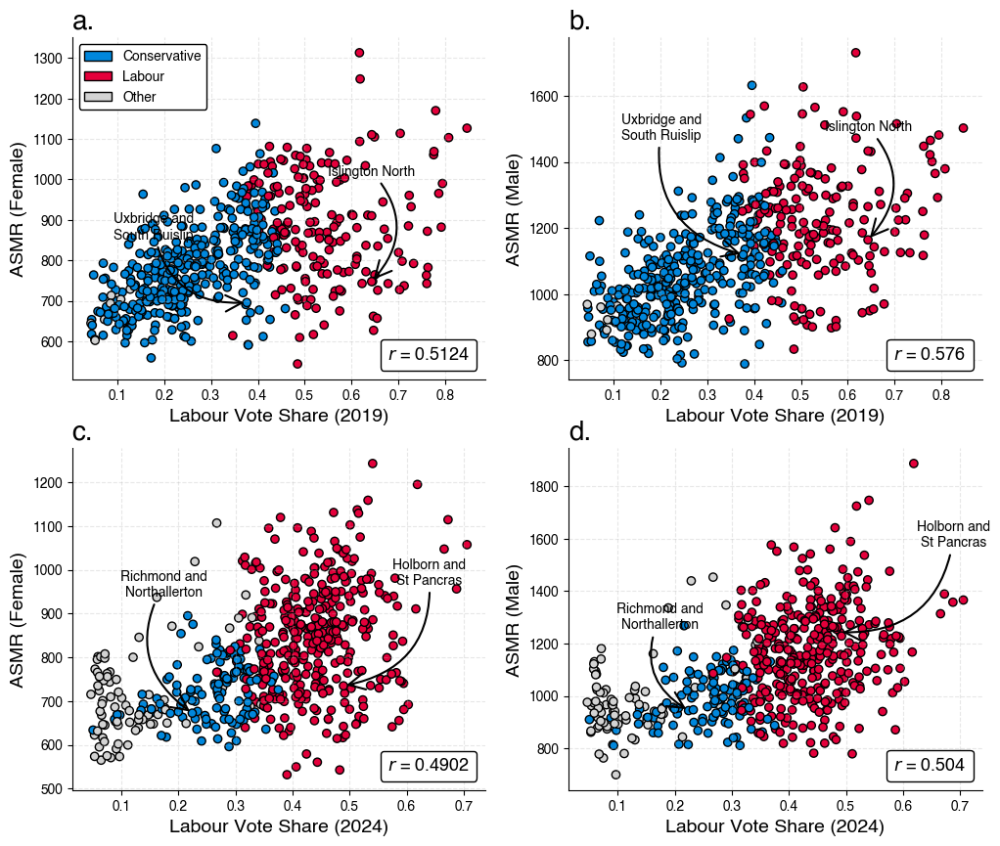

In [9]:
plot_scatters(df_2019, df_2024, ['Lab PC', 'Labour', True])

### 2.2 Conservative Vote Share and ASMR

This repeats the same ASMR scatterplot structure for Conservative vote share.


The length of the 2019 data going into the scatters is:  532
The length of the 2024 data going into the scatters is:  542
2019: Conservative vote share vs ASMR (F) pearsons r: -0.3405, p-value 6.535561214821793e-16
2019: Conservative vote share vs ASMR (M) pearsons r: -0.434, p-value 8.67104887968828e-26
2024: Conservative vote share vs ASMR (F) pearsons r: -0.5426, p-value 7.945434762041239e-43
2024: Conservative vote share vs ASMR (M) pearsons r: -0.595, p-value 2.9026468769800783e-53


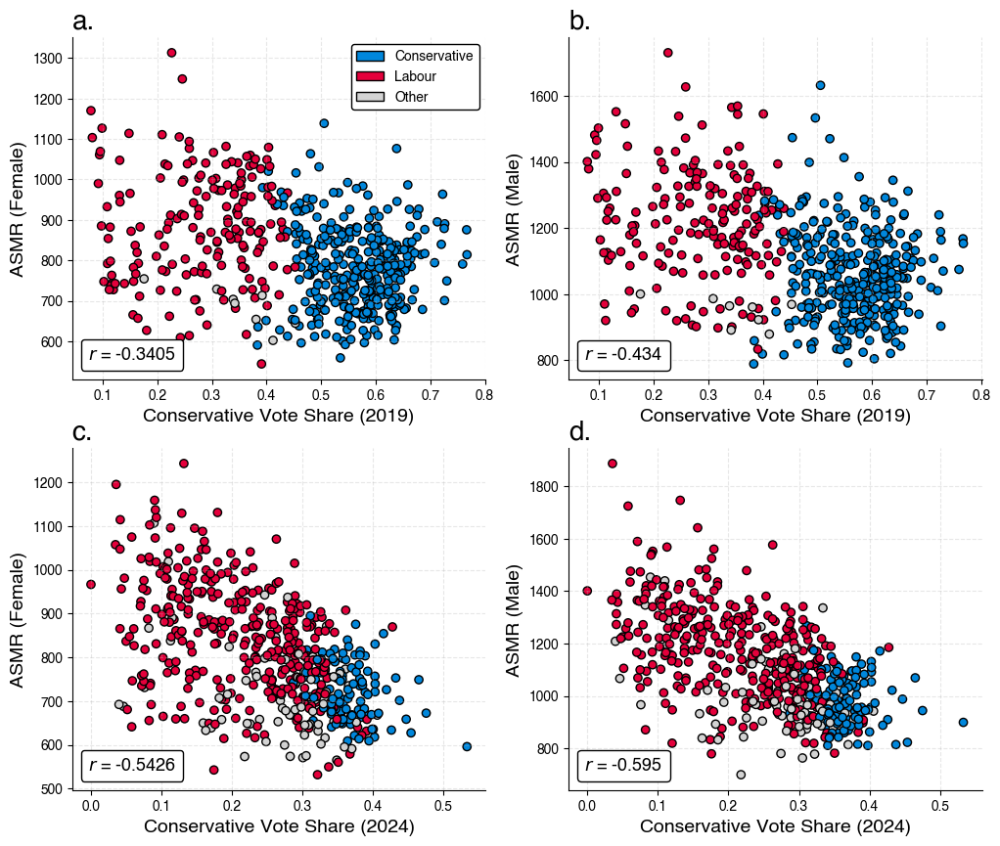

In [10]:
plot_scatters(df_2019, df_2024, ['Con PC', 'Conservative', False])

### 2.3 Liberal Democrat Vote Share and ASMR

This repeats the same ASMR scatterplot structure for Liberal Democrat vote share.


The length of the 2019 data going into the scatters is:  532
The length of the 2024 data going into the scatters is:  542
2019: Liberal Democrat vote share vs ASMR (F) pearsons r: -0.5544, p-value 3.33557580710986e-44
2019: Liberal Democrat vote share vs ASMR (M) pearsons r: -0.523, p-value 1.1177690605379016e-38
2024: Liberal Democrat vote share vs ASMR (F) pearsons r: -0.4533, p-value 8.099836589724963e-29
2024: Liberal Democrat vote share vs ASMR (M) pearsons r: -0.461, p-value 6.254551576468924e-30


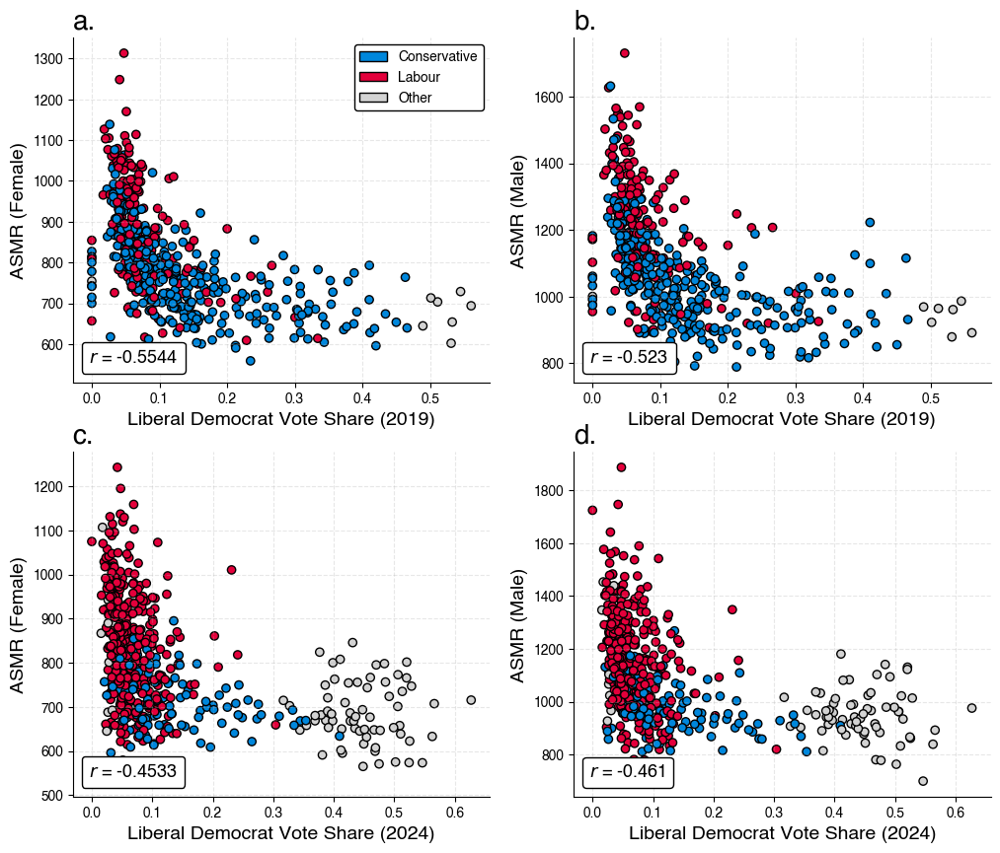

In [11]:
plot_scatters(df_2019, df_2024, ['Lib PC', 'Liberal Democrat', False])

### 2.4 Turnout and ASMR

This uses the proportion of the electorate voting as the x-axis rather than a party vote share.


The length of the 2019 data going into the scatters is:  532
The length of the 2024 data going into the scatters is:  542
2019: Turnout vote share vs ASMR (F) pearsons r: -0.7137, p-value 5.28055846040719e-84
2019: Turnout vote share vs ASMR (M) pearsons r: -0.746, p-value 1.0813232273479608e-95
2024: Turnout vote share vs ASMR (F) pearsons r: -0.7445, p-value 8.261501390094187e-97
2024: Turnout vote share vs ASMR (M) pearsons r: -0.799, p-value 3.5281162571550103e-121


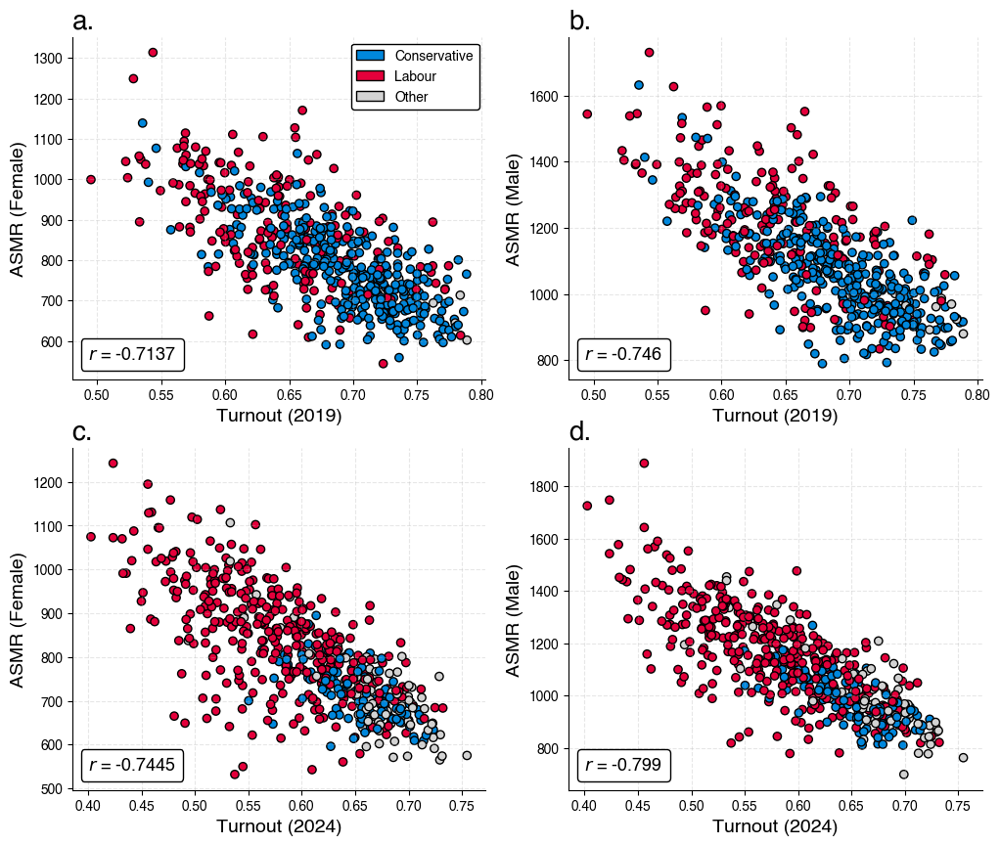

In [12]:
plot_scatters(df_2019, df_2024, ['Vote PC', 'Turnout', False])

## 3. Constituency Geographies and Bivariate Maps

This section attaches constituency geometries to the merged analysis data. These geodataframes power both the ASMR bivariate maps and the Census health and disability maps.


### 3.1 Attach Constituency Boundaries

The 2019 and 2024 shapefiles are different because the constituency boundaries changed. The helper function reads the relevant shapefile and joins it to the corresponding merged dataframe.


In [13]:
df_gpd_2019 = make_df_gpd(2019, df_2019)
df_gpd_2024 = make_df_gpd(2024, df_2024)


### 3.2 Keep English Constituencies

The analysis is restricted to England. This filter is repeated here as an explicit geodataframe-level check before plotting.


In [14]:
df_gpd_2019 = df_gpd_2019[df_gpd_2019['Country name']== 'England']
df_gpd_2024 = df_gpd_2024[df_gpd_2024['Country name']== 'England']

### 3.3 Check Geodataframe Sizes

These counts should match the English constituency counts for each election year before the speaker is removed for correlation tables.


In [15]:
print('Lenth of pandas gpd in 2019: ', len(df_gpd_2019))
print('Lenth of pandas gpd in 2024: ', len(df_gpd_2024))

Lenth of pandas gpd in 2019:  533
Lenth of pandas gpd in 2024:  543


### 3.4 ASMR Bivariate Choropleth Maps

These maps show each constituency by two dimensions at once: vote share and ASMR. The bivariate color scale is built from pooled 2019 and 2024 quantiles so that the two election years are comparable within each party or turnout view.


Length of the 2019 dataset going into this:  533
Length of the 2024 dataset going into this:  543


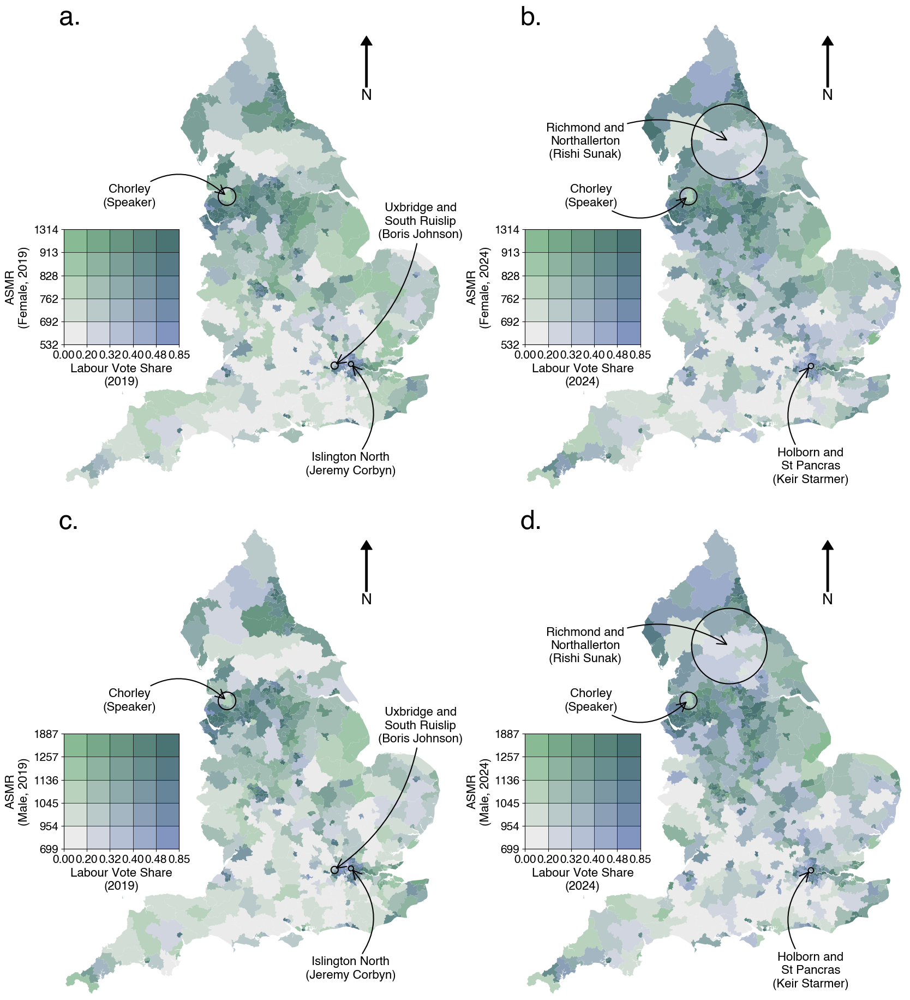

Length of the 2019 dataset going into this:  533
Length of the 2024 dataset going into this:  543


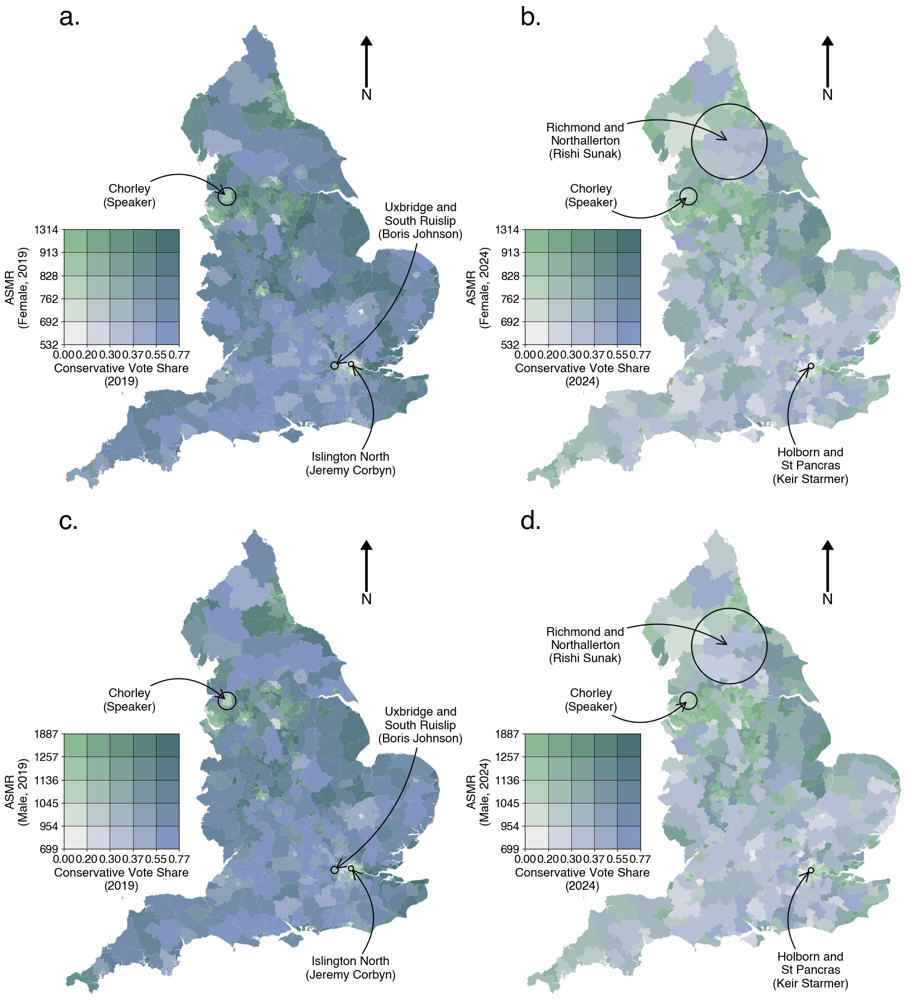

Length of the 2019 dataset going into this:  533
Length of the 2024 dataset going into this:  543


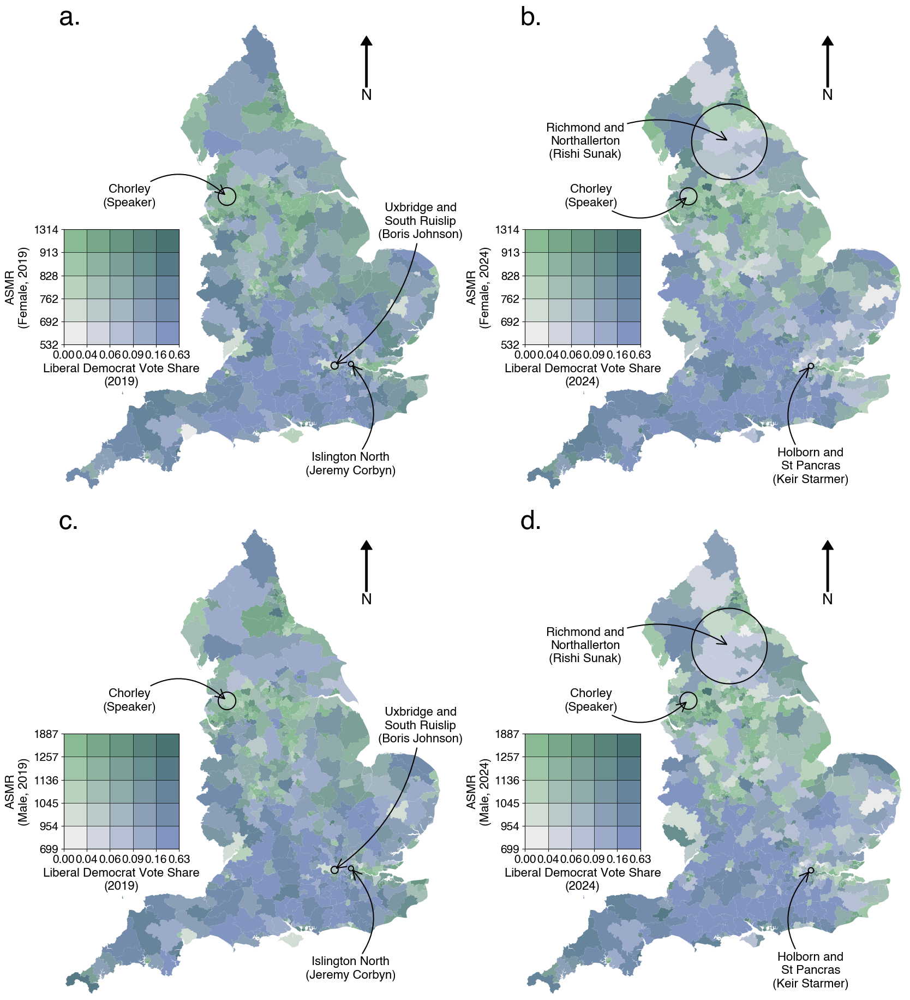

Length of the 2019 dataset going into this:  533
Length of the 2024 dataset going into this:  543


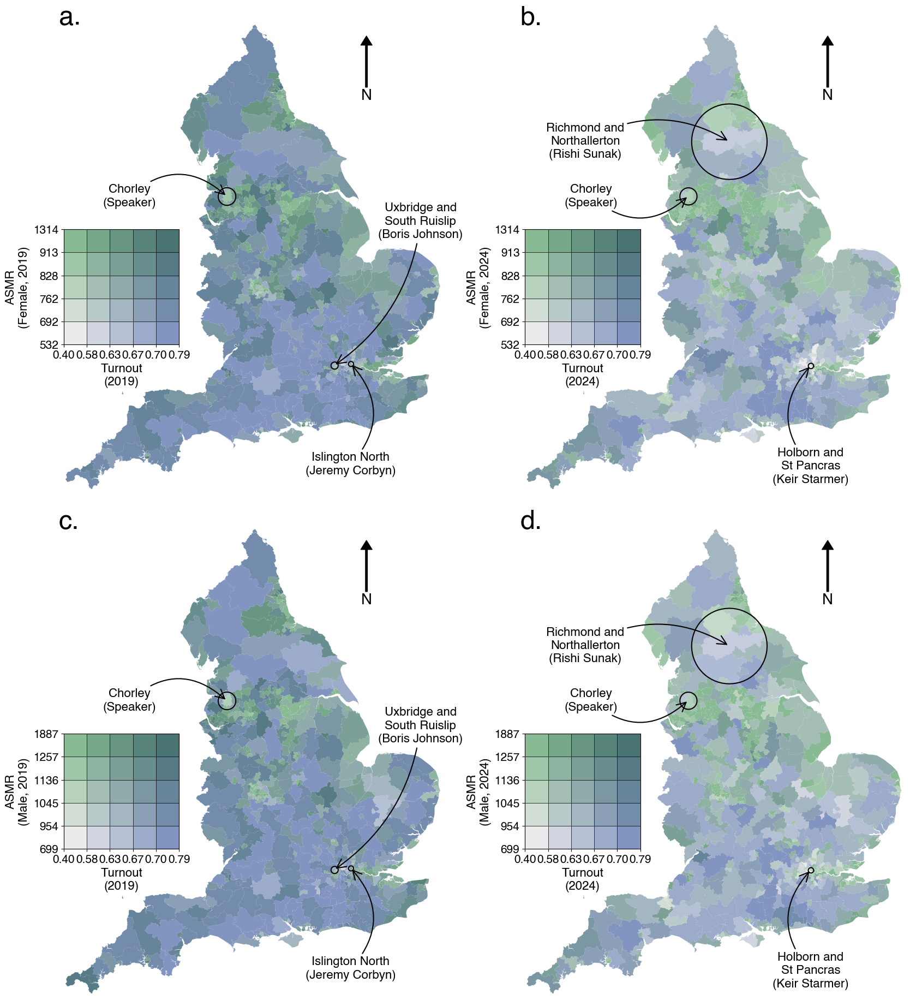

In [16]:
for party in [
    ['Lab', 'Labour'],
    ['Con', 'Conservative'],
    ['Lib', 'Liberal Democrat'],
    ['Vote', 'Turnout'],
]:
    display(plot_bivariate_choropleth_map_asmr(df_gpd_2019, df_gpd_2024, party))


### 3.5 Census Health and Disability Bivariate Maps

These maps compare vote share with two Census outcomes: the proportion of people in not good health and the proportion disabled under the Equality Act. Both variables are oriented so that larger values mean worse health or higher disability prevalence.


#### Labour Vote Share

This is the primary census-health map used for reporting.


Length of the 2019 dataset going into this:  533
Length of the 2024 dataset going into this:  543


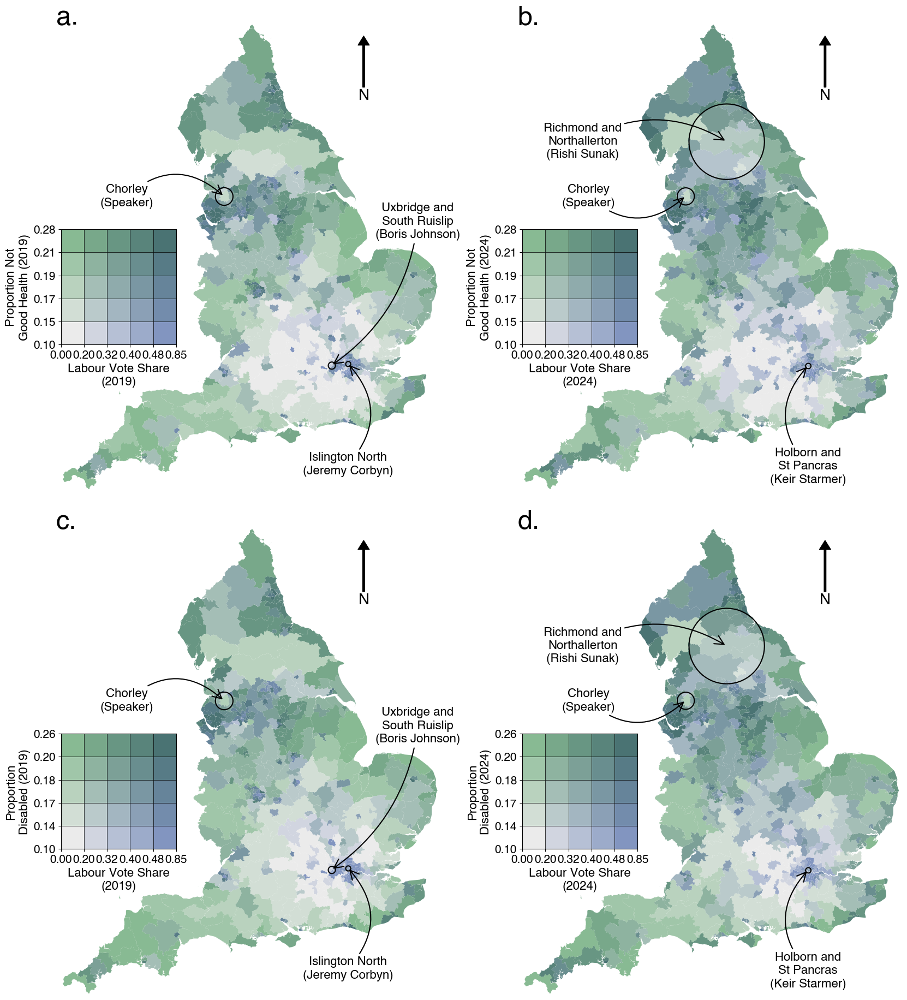

In [17]:
plot_bivariate_choropleth_map_census(df_gpd_2019,
                                      df_gpd_2024,
                                      ['Lab', 'Labour'])


#### Conservative Vote Share

This repeats the census-health map for Conservative vote share.


Length of the 2019 dataset going into this:  533
Length of the 2024 dataset going into this:  543


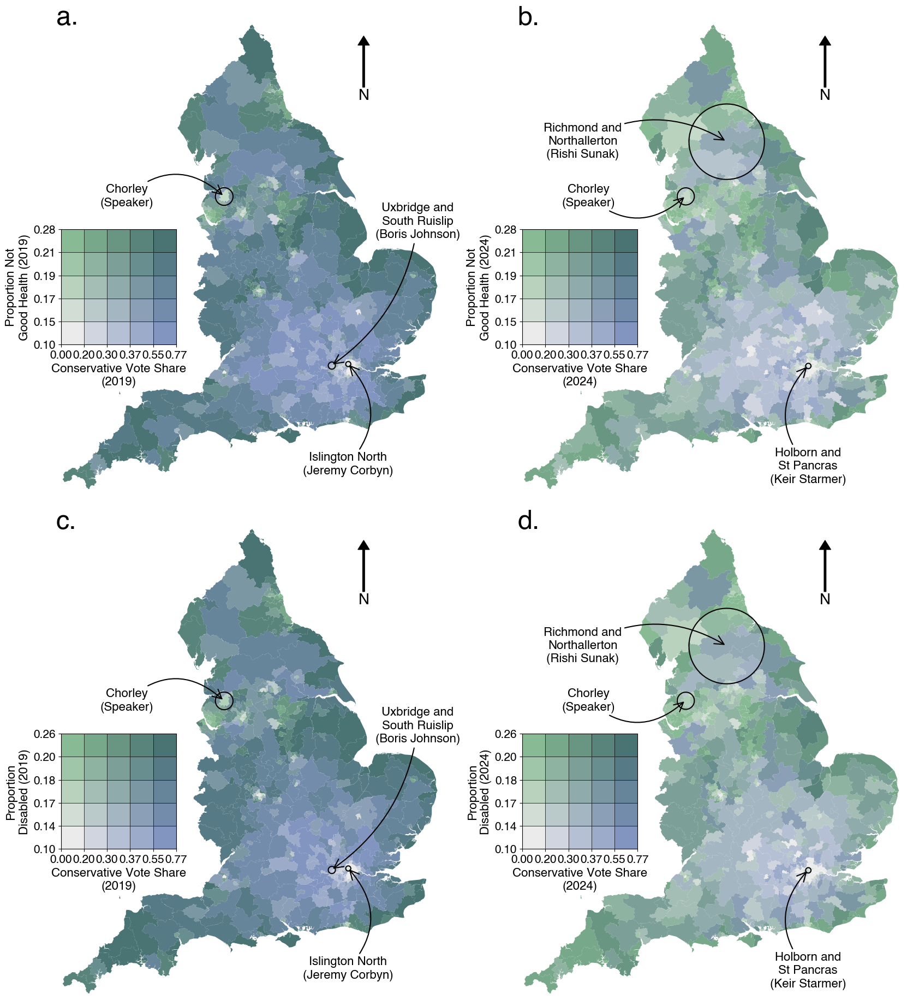

In [18]:
plot_bivariate_choropleth_map_census(df_gpd_2019,
                                     df_gpd_2024,
                                     ['Con', 'Conservative'])

#### Liberal Democrat Vote Share

This repeats the census-health map for Liberal Democrat vote share.


Length of the 2019 dataset going into this:  533
Length of the 2024 dataset going into this:  543


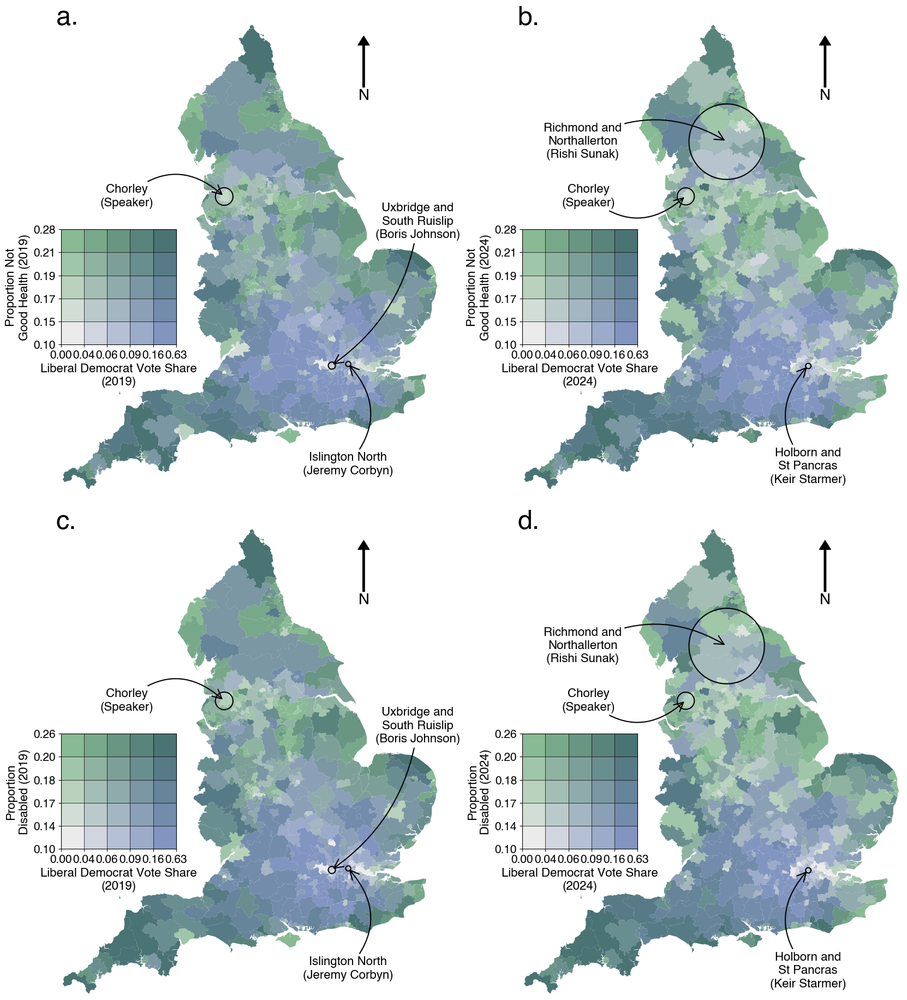

In [19]:
plot_bivariate_choropleth_map_census(df_gpd_2019,
                                     df_gpd_2024,
                                     ['Lib', 'Liberal Democrat'])

#### Turnout

This maps Census health and disability against the proportion of the electorate voting.


Length of the 2019 dataset going into this:  533
Length of the 2024 dataset going into this:  543


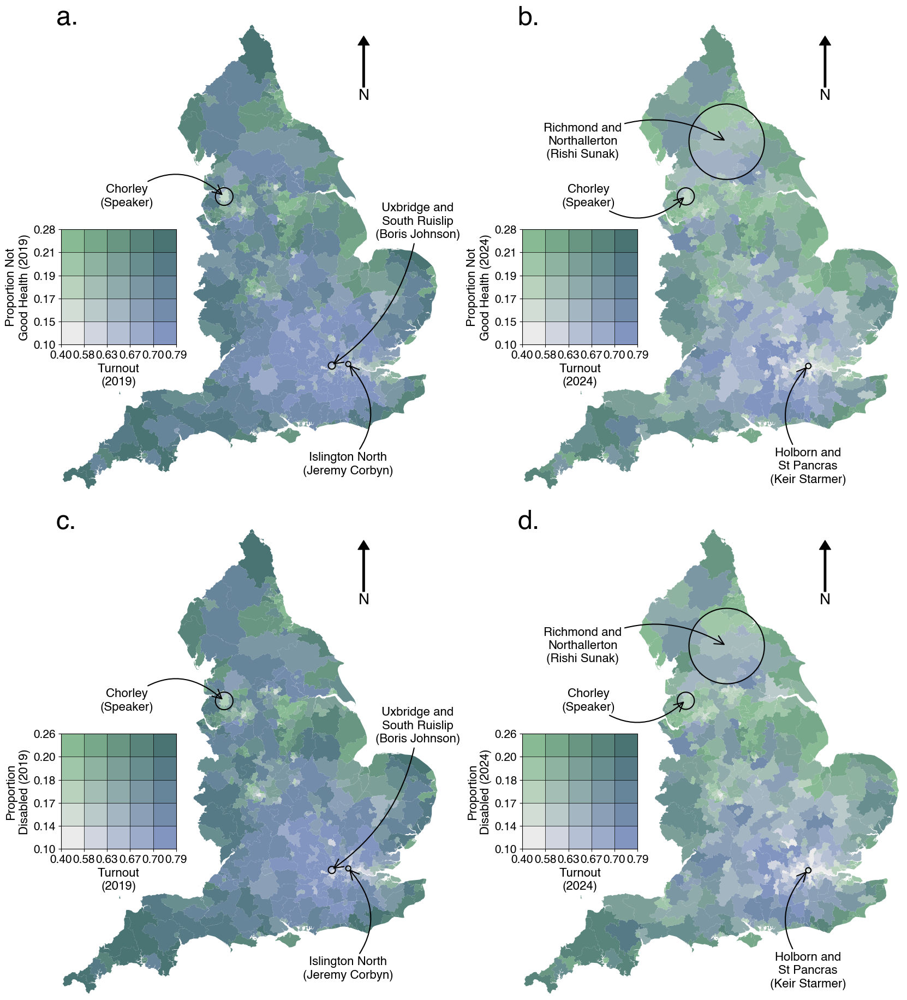

In [20]:
plot_bivariate_choropleth_map_census(df_gpd_2019,
                                     df_gpd_2024,
                                     ['Vote', 'Turnout'])

## 4. Summary Correlations

The map annotations retain the speaker's constituency, but the correlation tables remove it because the speaker has zero votes for the main parties. The tables report both Spearman and Pearson correlations for party vote share or turnout against mortality, Census health and disability, unpaid care, and health deprivation.

The Health Deprivation and Disability variable is a rank where `1` is most deprived. Higher rank therefore means less deprived, so its signs should be interpreted in the opposite direction to ASMR, bad-health prevalence, and disability prevalence.


### 4.1 Remove Speaker Constituency for Correlations

The speaker is excluded only from the correlation inputs, after map generation is complete.


In [21]:
df_gpd_2019 = df_gpd_2019[df_gpd_2019['First party']!='Spk']
df_gpd_2024 = df_gpd_2024[df_gpd_2024['First party']!='Spk']

### 4.2 Build Correlation Tables

`make_summary_tables()` returns coefficient tables and p-value tables for each election year. The printed tables below show the coefficients.


In [22]:
table_rho_2019, table_p_2019 = make_summary_tables(df_2019, df_gpd_2019, '2019')
table_rho_2024, table_p_2024 = make_summary_tables(df_2024, df_gpd_2024, '2024')


### 4.3 2019 Correlation Coefficients

These are the 2019 Spearman and Pearson coefficients for the main health and deprivation variables.


In [23]:
print(table_rho_2019.round(4).to_string(index=False))


Statistic                           Variable Year   N    Con PC    Lab PC    Lib PC    Brx PC   Vote PC
 Spearman                             ASMR_f 2019 532  -0.30313  0.529495 -0.694467  0.581896 -0.710661
 Spearman                             ASMR_m 2019 532 -0.403006  0.594981 -0.671486  0.609388 -0.741387
 Spearman                ProportionBadHealth 2019 532   0.03555  0.166866 -0.565167  0.360762 -0.522315
 Spearman                 ProportionDisabled 2019 532  0.078612  0.051843  -0.42684   0.27607 -0.340309
 Spearman    ProportionProvidesAnyUnpaidCare 2019 532  0.302573 -0.156425 -0.323585  0.084371 -0.138407
 Spearman HealthDeprivationAndDisabilityRank 2019 532  0.430727 -0.627258  0.687219 -0.657587  0.722431
  Pearson                             ASMR_f 2019 532 -0.340542  0.512369 -0.554429  0.558247 -0.713739
  Pearson                             ASMR_m 2019 532 -0.433536  0.575957 -0.522961  0.548825 -0.746142
  Pearson                ProportionBadHealth 2019 532  0.035302 

### 4.4 2024 Correlation Coefficients

These are the same coefficients for 2024, using Reform UK vote share in place of the 2019 Brexit Party vote share.


In [24]:
print(table_rho_2024.round(4).to_string(index=False))


Statistic                           Variable Year   N    Con PC    Lab PC    Lib PC    RUK PC   Vote PC
 Spearman                             ASMR_f 2024 542 -0.531086  0.486212 -0.549767  0.429943 -0.736345
 Spearman                             ASMR_m 2024 542 -0.594693  0.513817 -0.575403  0.363567 -0.796572
 Spearman                ProportionBadHealth 2024 542 -0.202541  0.179498 -0.464859  0.635212 -0.478684
 Spearman                 ProportionDisabled 2024 542 -0.147517  0.133734 -0.322448  0.602563 -0.298308
 Spearman    ProportionProvidesAnyUnpaidCare 2024 542  0.125804 -0.063295 -0.272532  0.627474 -0.078919
 Spearman HealthDeprivationAndDisabilityRank 2024 542  0.625617 -0.564978  0.601453 -0.381987  0.802872
  Pearson                             ASMR_f 2024 542 -0.542641   0.49016 -0.453269  0.367745 -0.744481
  Pearson                             ASMR_m 2024 542 -0.595254  0.504316 -0.461414  0.303234 -0.798626
  Pearson                ProportionBadHealth 2024 542 -0.184946 

## 5. National Temporal Context

The final section adds national context using life-expectancy inequality data. This is separate from the constituency-level election analysis and is used to show how broader health inequality patterns changed over time.


### 5.1 Load Life-Expectancy Inequality Data

The first dataset contains the slope index of inequality for life expectancy. The second contains healthy life expectancy by deprivation decile.


In [25]:
df_sii = make_sii()
df_hid = make_hid()

### 5.2 Plot Health Inequality Over Time

This figure combines the life-expectancy inequality time series with healthy life expectancy in the most deprived, middle, and least deprived deciles.


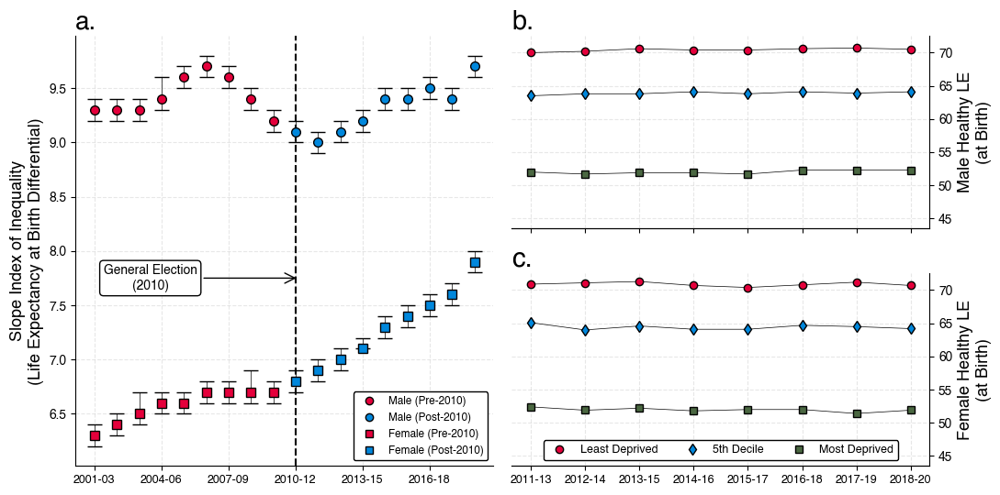

In [26]:
plot_over_time(df_sii, df_hid)

### 5.3 Print Reported Scalars

These values are printed separately so they can be copied directly into manuscript text or checked against figure annotations.


In [27]:
make_temporal_printouts(df_sii, df_hid)

In 2001-2003, the SII for females was: 6.3
In 2018-2020, the SII for females was: 7.9
In 2001-2003, the SII for males was: 9.3
In 2018-2020, the SII for males was: 9.7
In 2011-2013, Male Healthy LE for 1st decile was: 52.0
In 2011-2013, Male Healthy LE for 10th decile was: 70.0
In 2018-2020, Male Healthy LE for 1st decile was: 52.3
In 2018-2020, Male Healthy LE for 10th decile was: 70.5
In 2011-2013, Female Healthy LE for 1st decile was: 52.4
In 2011-2013, Female Healthy LE for 10th decile was: 70.9
In 2018-2020, Female Healthy LE for 1st decile was: 51.9
In 2018-2020, Female Healthy LE for 10th decile was: 70.7
